# Session 3: Clustering and annotation

## Identification of clusters in the visium data

In this tutorial, we will start with analyzing the annotated dataframe object (anndata) created in Session 2.

A crucial step in analyzing single-cell and spatial data is identification of regions, commonly through clustering and annotations.

Do you see any issues with clustering spatial data based on gene expression?

In [1]:
import scanpy as sc
sc.settings.verbosity = 3

In [2]:
filepath = "lymph_node_raw.h5ad"

In [3]:
adata = sc.read(filepath)

In Scanpy, we can define figure parameters for better visualizations. Here, we set dpi to 100.

In [4]:
sc.set_figure_params(dpi=100)

In [5]:
adata

AnnData object with n_obs × n_vars = 3861 × 19685
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'log1p', 'neighbors', 'pca', 'spatial', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

## Note on clustering algorithms

There are multiple algorithms for identification of clusters. Three most prominent are k-means, louvain and leiden algorithms.
kNN requires predefined number of clusters while louvain and leiden require a resolution hyperparameter. A higher resolution leads to an increase in clusters.
Here, we'll work with leiden clustering.

In Scanpy, [sc.tl.leiden()](https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.leiden.html) provides an easy way to compute clusters. It uses the neighbor and connectivity graph computed in session 2 using [sc.pp.neighbors()](https://scanpy.readthedocs.io/en/stable/generated/scanpy.pp.neighbors.html).

By default, the above step uses a resolution of 1 and adds a column with name "leiden" in .obs attribute of the adata object. These can be modified using arguments "resolution" and "key_added".

In [6]:
# Run leiden clustering with default parameters.
sc.tl.leiden(adata)

running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [7]:
adata.obs["leiden"]

AAACAAGTATCTCCCA-1    2
AAACAATCTACTAGCA-1    3
AAACAGAGCGACTCCT-1    8
AAACAGCTTTCAGAAG-1    1
AAACAGGGTCTATATT-1    0
                     ..
TTGTTTCACATCCAGG-1    6
TTGTTTCATTAGTCTA-1    6
TTGTTTCCATACAACT-1    6
TTGTTTGTATTACACG-1    3
TTGTTTGTGTAAATTC-1    3
Name: leiden, Length: 3861, dtype: category
Categories (9, object): ['0', '1', '2', '3', ..., '5', '6', '7', '8']

/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


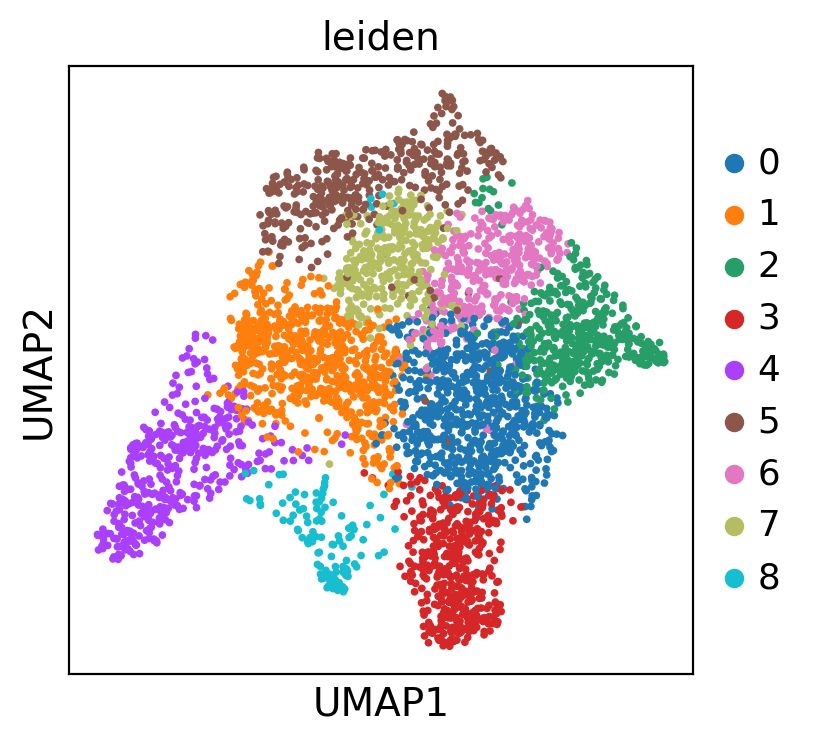

/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


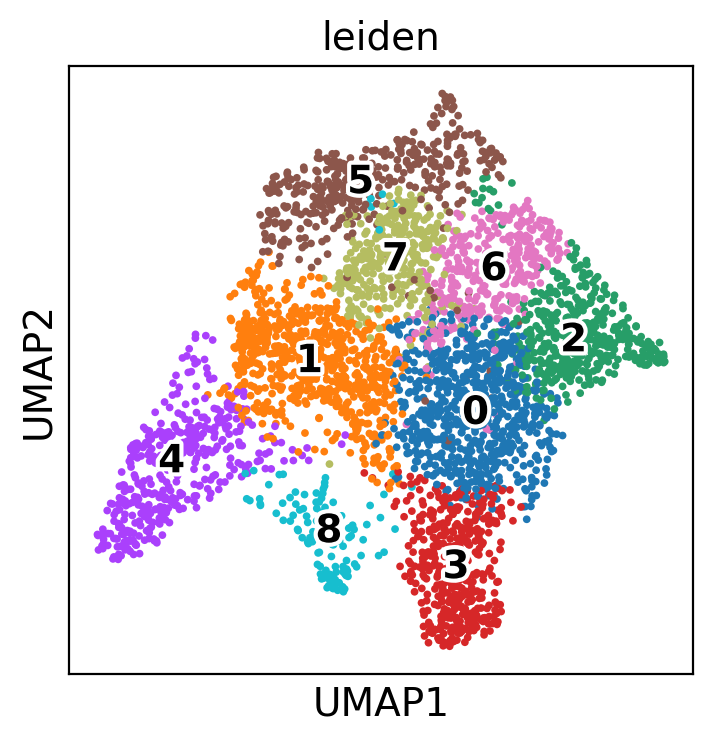

In [8]:
# Plot clusters on UMAP

sc.pl.umap(adata, color="leiden")
sc.pl.umap(adata, color="leiden", legend_loc="on data", legend_fontoutline=3) #  "on data" option labels the cluster names on top of their respective clusters

We can also compute the cluster hierarchy using [sc.tl.dendrogram()](https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.dendrogram.html) and plot it using [sc.pl.dendrogram()](https://scanpy.readthedocs.io/en/stable/generated/scanpy.pl.dendrogram.html).


    using 'X_pca' with n_pcs = 100
Storing dendrogram info using `.uns['dendrogram_leiden']`


/opt/conda/lib/python3.10/site-packages/scanpy/tools/_dendrogram.py:105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(adata.obs[group]):
/opt/conda/lib/python3.10/site-packages/scanpy/tools/_dendrogram.py:133: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_df = rep_df.groupby(level=0).mean()


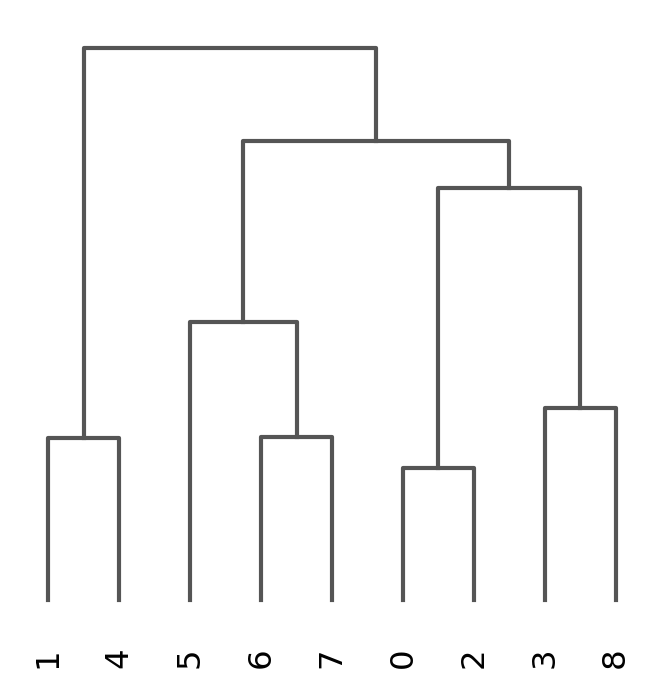

<Axes: >

In [9]:
sc.tl.dendrogram(adata, groupby="leiden")
sc.pl.dendrogram(adata, groupby="leiden")

We see three main clusters that subdivide into total 9 clusters (from 0 to 8).

**How do you think one can choose optimal resolution?**

An increase in resolution results in more granuality. We can try with different resolution pararameter to see this.

In [10]:
import numpy as np
resolutions = list(np.linspace(0.25, 2, 8)) # This gives us 8 resolutions between 0.25 and 2.
leiden_columns = [] #  We'll add the key_added parameters to this list to be able to plot them 

for resolution in resolutions:
    # Run leiden algorithm using current resolution and add a column in .obs.
    sc.tl.leiden(adata, resolution=resolution, key_added=f'leiden_{resolution}')
    leiden_columns.append(f'leiden_{resolution}')

running Leiden clustering
    finished: found 6 clusters and added
    'leiden_0.25', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden_0.75', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden_1.0', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden_1.25', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden_1.5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 16 clusters and added
    'leiden_1.75', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clust

/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future ve

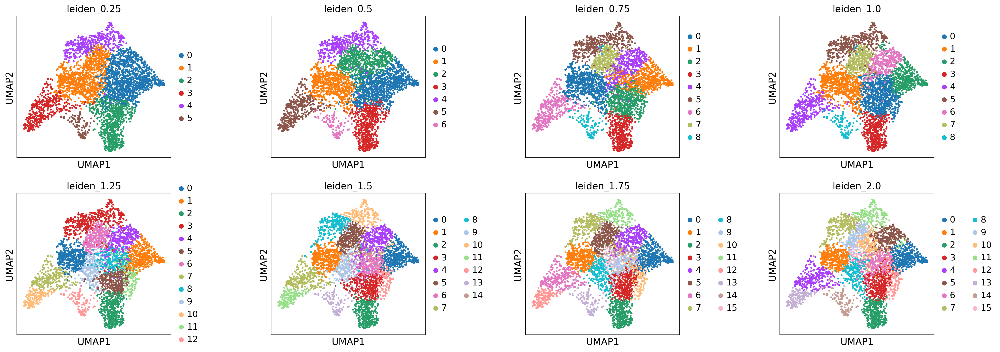

In [11]:
# Plot clusterings at different resolutions
sc.pl.umap(adata, color=leiden_columns, wspace=0.5) 
# wspace adjusts the horizontal space between two subplots. This is useful to make sure labels don't overlap with the subsequent plot.

More quantitative ways to compute optimal resolution can be dependent on some metrics such as [sillouette scores](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html). Unfortunately, these metrics usually utilize some distance metrics which in turn requires a selection step.

Can you think of other ways to select an optimal resolution?

## Cluster identities

**What ways (automated or manual) can you utilize for cluster identification?**

Each spot in 10x Visium data is a mixture of cells and potentially, cell types. Therefore the task of cluster identity can be approached in two ways:

1. Identify clusternated by particular cell types also known as niches.
2. Characterize clusters with cell deconvolution framework which primarily utilizes a single-cell dataset(s) to predict cell type proportions with each spot.

Here, we focus on the first approach which makes use of known cell type marker genes. We select some marker genes for major cell types in lymph node as extracted using the [Human Biomedical Molecular Atlas Program (HuBMAP)](https://hubmapconsortium.org/).

In [12]:
# Cell type marker genes in lymph node

markers_dict = {"Plasma": ['CD38', 'IRF4', 'PRDM1', 'SDC1'],
                "B naive": ['CD19', 'MS4A1', 'IGHD', 'FCER2', 'HLA-DRA', 'SELL'],
                "B memory": ["CD19", "MS4A1", "HLA-DRA"],
                "centrocyte": ['BCL6', 'CD19', 'CD83', 'MKI67', 'MS4A1'],
                "centroblast": ['AICDA', 'BCL6', 'CD19', 'CD27', 'CXCR4', 'MKI67', 'MS4A1'],
                "reticular": ["CXCL12", "TNFSF11"],
                "T naive": ['CD3D', 'CCR7', 'SELL'],
                "T memory": ['CD3D', 'CXCR6', 'ITGA1'],
                "Macrophage": ['CD14', 'HLA-DRA', 'ITGAX'],
                "non-follicular DC": ['XCR1', 'CADM1', 'CLEC9A', 'BATF3', 'IDO1', 'IL3RA', 'CLEC4C', 'GZMB', 'JCHAIN',
                                     'ITGAX', 'CD40', 'CD83', 'HLA-DRA'],
                "Follicular DC": ['CR2', 'CXCL13', 'FCGR1B', 'MADCAM1', 'MFGE8', 'VCAM1', 'FCER2', 'FCGR1B'],
                "blood vessel endothelial": ['CAV1', 'CCL14', 'CD34', 'ACKR1', 'EMCN', 
                                             'ESAM', 'ICAM1', 'JAM2', 
                                             'MARCO', 'PLVAP', 'NECTIN2', 'SPARCL1'],
                "SMC/myofibroblast": ['ACTA2', 'COL1A1', 'COL3A1'],
                "Mast": ['KIT', 'MS4A2', 'TPSAB1', 'TPSB2'],
                "NK": ['ID2', 'KLRD1']
               }

In [13]:
# Scale data

# Store log normalized count (before scaling) in a layer so we don't lose them
adata.layers["log_counts"] = adata.X.copy()

# Actually scale the data. This will replace adata.X with standard normalized counts
sc.pp.scale(adata)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


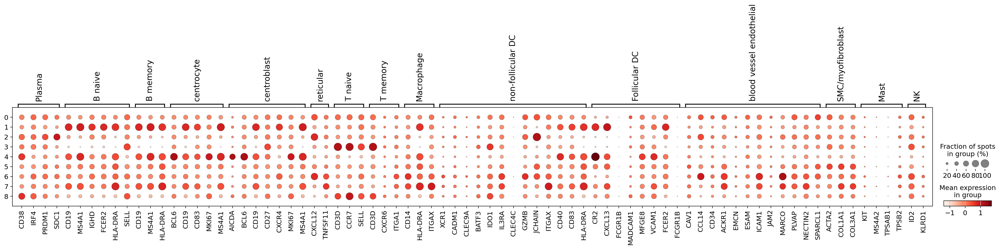

In [14]:
sc.pl.dotplot(adata, var_names=markers_dict, groupby="leiden", swap_axes=False, use_raw=False, size_title='Fraction of spots\nin group (%)')


To plot these gene expressions nicely, we can adjust the colormap so that colors for negative and positive expressions are different.
We can also clip the color scale values between -1 and 1 as we see on the right side in "Mean expression in group" colormap, the values largely fall within these two extremes. 

/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


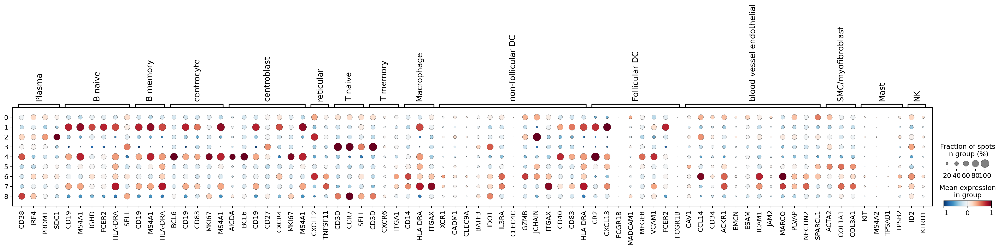

In [15]:
sc.pl.dotplot(adata, var_names=markers_dict, groupby="leiden", swap_axes=False, use_raw=False, size_title='Fraction of spots\nin group (%)',
             cmap="RdBu_r", vmin=-1, vcenter=0, vmax=1)


We can see there are some genes that are expressed in one or two clusters over others. 

To make cluster identities clearer, we can make use of [sc.tl.score_genes()](https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.score_genes.html) that scores a list of genes against a control background of given size (by default 50).

In [16]:
# Iterate over the markers dictionary and store the computed store in .obs

for ct in markers_dict:
    sc.tl.score_genes(adata, markers_dict[ct], score_name=ct, use_raw=False)

computing score 'Plasma'
    finished: added
    'Plasma', score of gene set (adata.obs).
    150 total control genes are used. (0:00:00)
computing score 'B naive'


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


    finished: added
    'B naive', score of gene set (adata.obs).
    149 total control genes are used. (0:00:00)
computing score 'B memory'


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


    finished: added
    'B memory', score of gene set (adata.obs).
    50 total control genes are used. (0:00:00)
computing score 'centrocyte'


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


    finished: added
    'centrocyte', score of gene set (adata.obs).
    199 total control genes are used. (0:00:00)
computing score 'centroblast'


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


    finished: added
    'centroblast', score of gene set (adata.obs).
    199 total control genes are used. (0:00:00)
computing score 'reticular'


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


    finished: added
    'reticular', score of gene set (adata.obs).
    100 total control genes are used. (0:00:00)
computing score 'T naive'


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


    finished: added
    'T naive', score of gene set (adata.obs).
    100 total control genes are used. (0:00:00)
computing score 'T memory'


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


    finished: added
    'T memory', score of gene set (adata.obs).
    150 total control genes are used. (0:00:00)
computing score 'Macrophage'


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


    finished: added
    'Macrophage', score of gene set (adata.obs).
    150 total control genes are used. (0:00:00)
computing score 'non-follicular DC'


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


    finished: added
    'non-follicular DC', score of gene set (adata.obs).
    549 total control genes are used. (0:00:00)
computing score 'Follicular DC'


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


    finished: added
    'Follicular DC', score of gene set (adata.obs).
    250 total control genes are used. (0:00:00)
computing score 'blood vessel endothelial'


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


    finished: added
    'blood vessel endothelial', score of gene set (adata.obs).
    400 total control genes are used. (0:00:00)
computing score 'SMC/myofibroblast'


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


    finished: added
    'SMC/myofibroblast', score of gene set (adata.obs).
    100 total control genes are used. (0:00:00)
computing score 'Mast'


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


    finished: added
    'Mast', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)
computing score 'NK'


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


    finished: added
    'NK', score of gene set (adata.obs).
    100 total control genes are used. (0:00:00)


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Now, we can plot the score for each cell type.

/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


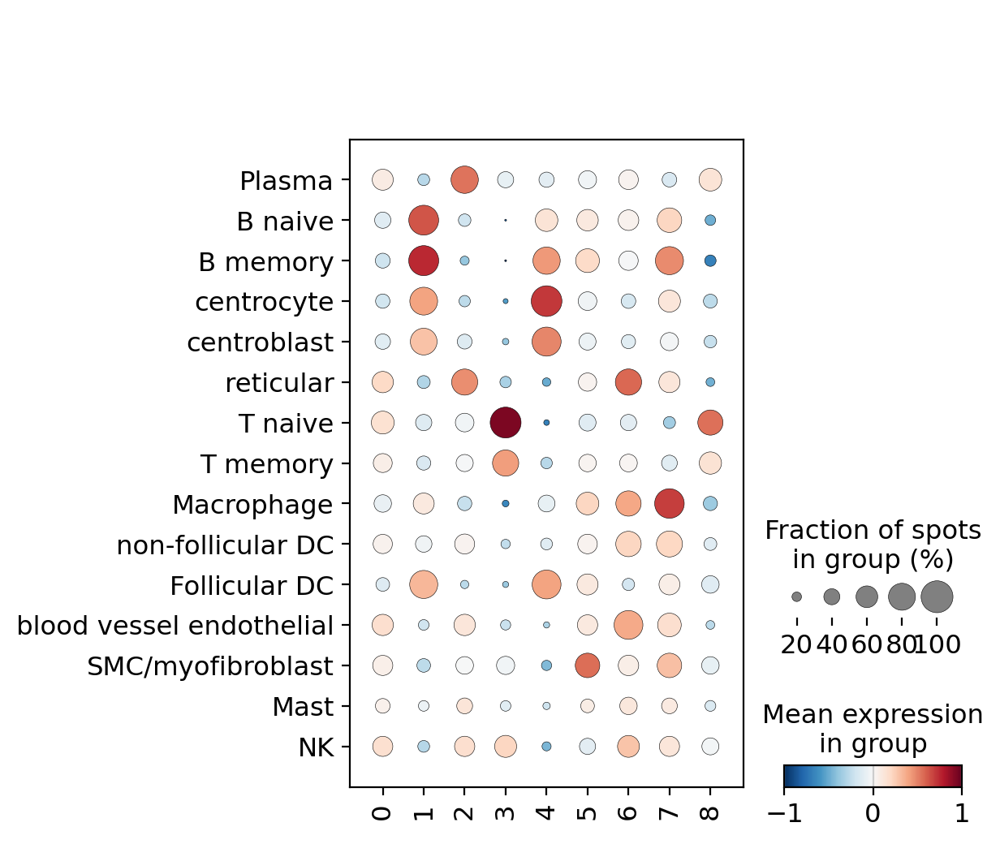

In [17]:
celltypes = list(markers_dict) 
sc.pl.dotplot(adata, var_names=celltypes, groupby="leiden", swap_axes=True, use_raw=False, size_title='Fraction of spots\nin group (%)',
             cmap="RdBu_r", vmin=-1, vcenter=0, vmax=1)


Based on the above, we label our clusters as different niches.

In [18]:
c_to_n_mapping = {"0": "Plasma/reticulate/NK/endo",
                  "1": "naiveB/Centrocyte/FDC",
                  "2": "Plasma/reticulate/NK/endo",
                  "3": "T/NK",
                  "4": "memoryB/Centrocyte/FDC",
                  "5": "SMC/myofibroblast/Macrophage/B",
                  "6": "reticulate/NK/Macrophage",
                  "7": "Macrophage/nFDC",
                  "8": "Plasma/T"}

In [19]:
adata.obs["niche"] = adata.obs["leiden"].replace(c_to_n_mapping)

In [20]:
adata.obs

,in_tissue,array_row,array_col,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,...,T naive,T memory,Macrophage,non-follicular DC,Follicular DC,blood vessel endothelial,SMC/myofibroblast,Mast,NK,niche
AAACAAGTATCTCCCA-1,1,50,102,6732,8.814776,27944.0,10.237993,33.241483,41.071429,48.375322,...,-0.364056,0.025654,-1.155139,-0.145694,-0.430004,0.717647,-0.108936,-0.273494,0.293210,Plasma/reticulate/NK/endo
AAACAATCTACTAGCA-1,1,3,43,6759,8.818778,25685.0,10.153702,23.507884,33.965349,42.631886,...,1.117766,0.319183,-1.100393,-0.523557,-0.177265,-0.107592,-0.376034,-0.328548,-0.014028,T/NK
AAACAGAGCGACTCCT-1,1,14,94,7236,8.886962,31916.0,10.370894,21.948239,31.990224,41.101642,...,0.609508,0.291477,-0.332150,-0.136943,0.051037,-0.291535,-0.458358,-0.306240,0.693945,Plasma/T
AAACAGCTTTCAGAAG-1,1,43,9,6890,8.837971,30932.0,10.339579,26.357817,38.132032,47.575327,...,-0.381958,-0.608685,0.245419,0.357776,0.358001,-0.570706,-0.697785,-0.202873,0.129023,naiveB/Centrocyte/FDC
AAACAGGGTCTATATT-1,1,47,13,7631,8.940105,31728.0,10.364986,22.462809,31.360313,39.696798,...,0.978848,0.187604,-0.734367,0.121808,-0.219134,0.057245,-0.697205,-0.028606,0.332845,Plasma/reticulate/NK/endo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTTCACATCCAGG-1,1,58,42,5771,8.660774,19649.0,9.885833,27.131152,35.950939,44.429742,...,-0.012529,0.226451,0.878603,0.099785,0.054062,0.289018,0.033020,1.371804,-0.178272,reticulate/NK/Macrophage
TTGTTTCATTAGTCTA-1,1,60,30,6354,8.756997,21557.0,9.978502,24.238067,32.263302,40.265343,...,-0.434479,0.119427,0.178796,0.399263,0.254915,0.492245,0.389358,-0.373541,1.345361,reticulate/NK/Macrophage
TTGTTTCCATACAACT-1,1,45,27,6517,8.782323,22175.0,10.006766,21.506201,30.593010,39.098083,...,0.656569,-0.591417,0.946528,0.281470,-0.028284,-0.156588,-0.482111,-0.256773,-0.176914,reticulate/NK/Macrophage
TTGTTTGTATTACACG-1,1,73,41,4476,8.406708,12268.0,9.414831,24.078904,34.268014,43.193675,...,0.154769,0.245370,-1.151509,-0.628350,-1.288200,-0.684894,-0.024476,-0.408382,0.587757,T/NK


/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


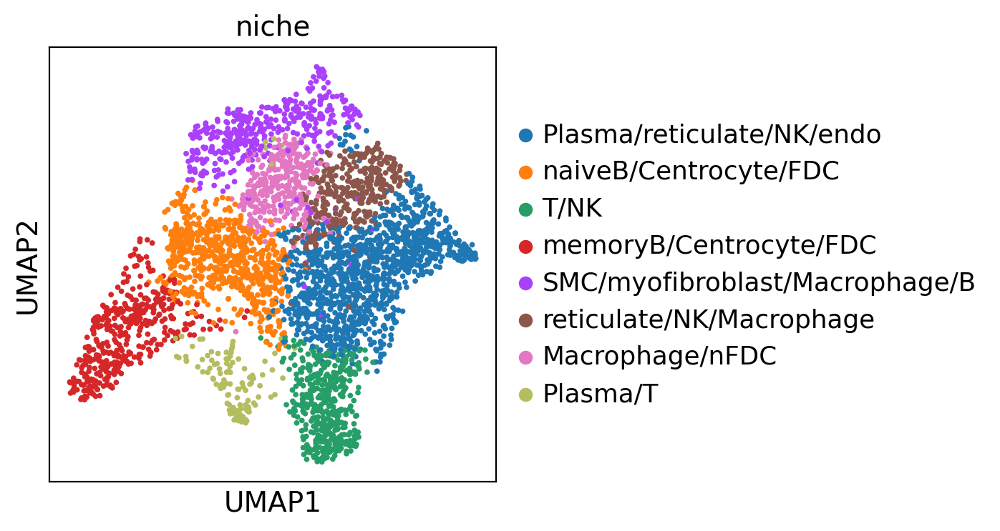

/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


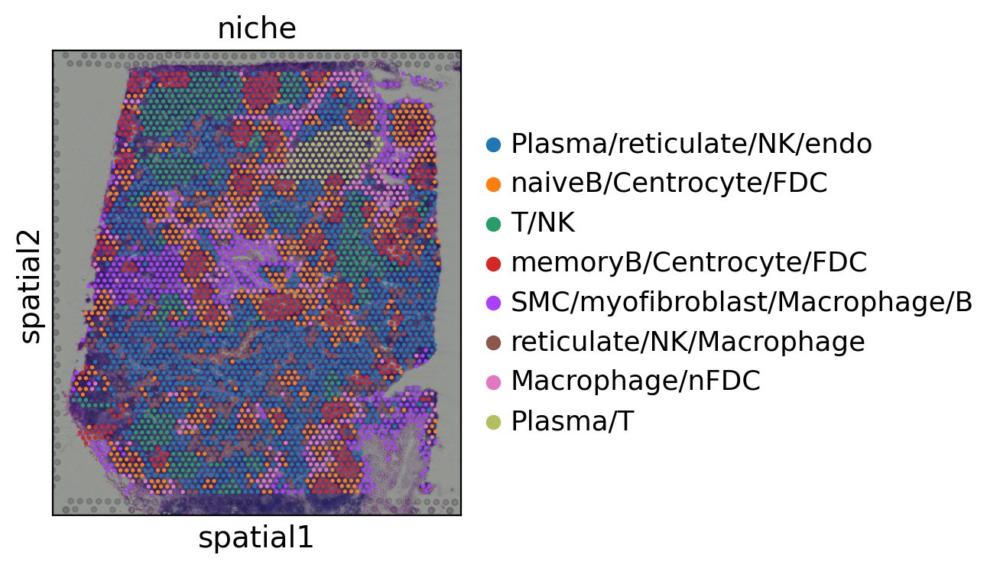

In [21]:
sc.pl.umap(adata, color="niche")
sc.pl.spatial(adata, color="niche")

## Number of spots within each region

In [22]:
adata.obs["niche"].value_counts()

niche
Plasma/reticulate/NK/endo         1140
naiveB/Centrocyte/FDC              679
T/NK                               437
memoryB/Centrocyte/FDC             410
SMC/myofibroblast/Macrophage/B     392
reticulate/NK/Macrophage           359
Macrophage/nFDC                    326
Plasma/T                           118
Name: count, dtype: int64

For this dataset, we also have a manual image-based annotation of germinal centers (GCs). We can plot that against our gene expression based regions.

In [23]:
import pandas as pd
df = pd.read_csv("/home/shared/Spatial_TX/lymph_node/manual_GC_annot.csv", index_col=0)

In [24]:
df

,GC,cell_type
Barcode,,
AAACAAGTATCTCCCA-1,NaN,0
AAACAATCTACTAGCA-1,NaN,0
AAACACCAATAACTGC-1,NaN,0
AAACAGAGCGACTCCT-1,NaN,0
AAACAGCTTTCAGAAG-1,NaN,0
...,...,...
TTGTTTCACATCCAGG-1,NaN,0
TTGTTTCATTAGTCTA-1,NaN,0
TTGTTTCCATACAACT-1,NaN,0


In [25]:
df["GC"].value_counts()

GC
GC    378
Name: count, dtype: int64

Out of 4,035 spots, 378 are identified as GCs based on image-based annotations.

Add these annotations to the adata object

In [26]:
# subset df to include only spots in the adata object.

df = df.loc[adata.obs.index]

# Add GC column to the adata object

adata.obs["manual_annotation"] = df["GC"]

/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


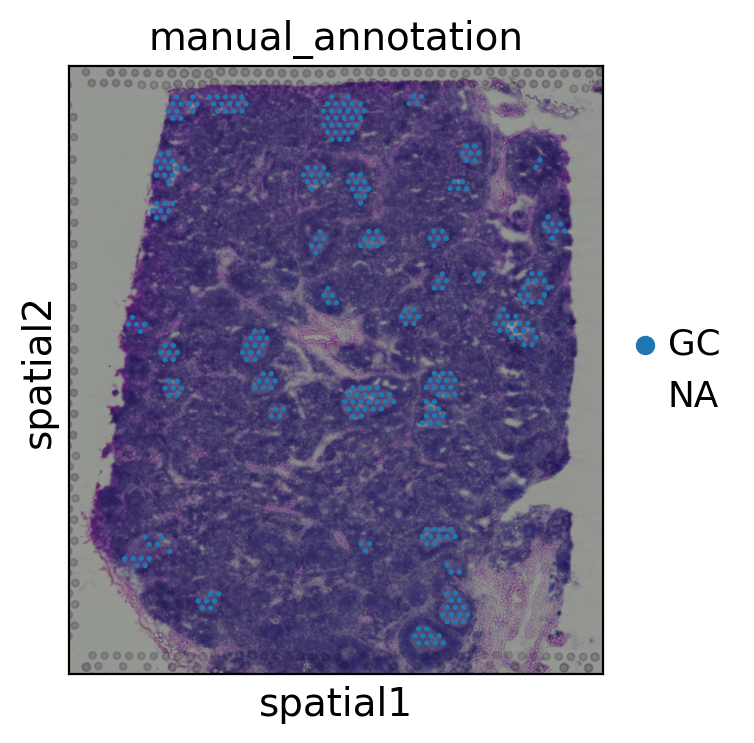

/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future ve

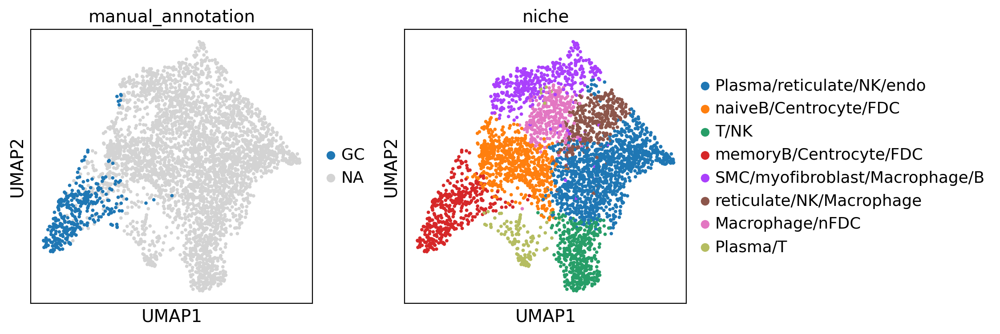

In [27]:
# Show manual annotations in ST and UMAP

sc.pl.spatial(adata, color="manual_annotation")
sc.pl.umap(adata, color=["manual_annotation", "niche"])

Here we can see the manual GC annotations correspond largely to memoryB/centrocyte/FDC. We can compute number of labels for GC spots below.

In [28]:
import matplotlib.pyplot as plt

df_comp = pd.crosstab(adata.obs["manual_annotation"], adata.obs["niche"])
df_comp

niche,Plasma/reticulate/NK/endo,naiveB/Centrocyte/FDC,memoryB/Centrocyte/FDC,SMC/myofibroblast/Macrophage/B,Plasma/T
manual_annotation,,,,,
GC,1,12,321,6,7


Text(0.5, 0, '')

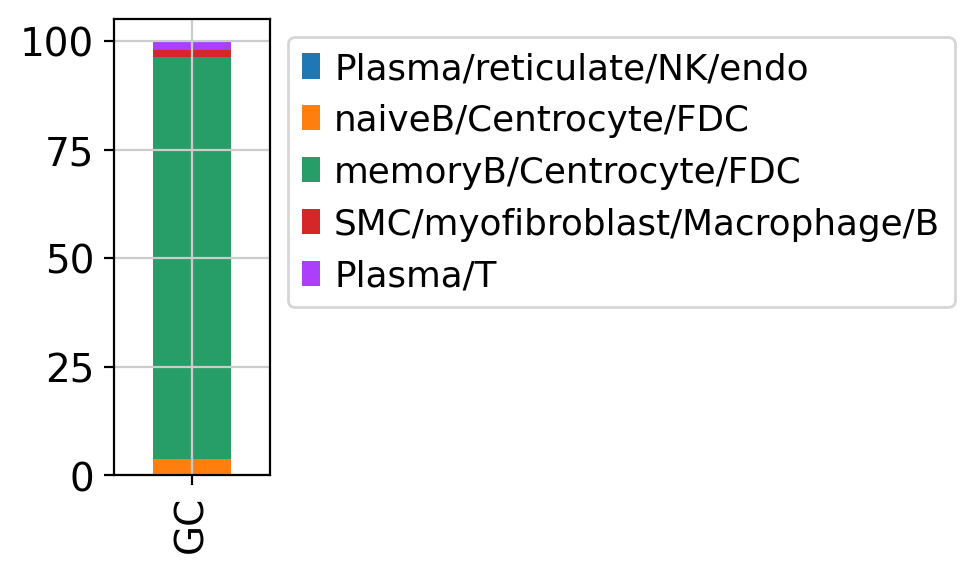

In [29]:
df_comp = df_comp.div(df_comp.sum(1),0)*100 # Convert to percentages
df_comp.plot(kind="bar", stacked=True, figsize=(1,3))
plt.legend(bbox_to_anchor=(1,1))
plt.xlabel("")

What do we know about the [Germinal centers](https://www.nature.com/articles/ni.2019)?

![Germinal Center](https://www.frontiersin.org/files/Articles/417112/fimmu-09-02469-HTML/image_m/fimmu-09-02469-g001.jpg)

Which other ways can be used to validate cluster annotations?

## Differential gene expression for each cluster

In [30]:
sc.tl.rank_genes_groups(adata, groupby="niche", key_added="niche_de", method="wilcoxon")

ranking genes


/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


    finished: added to `.uns['niche_de']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


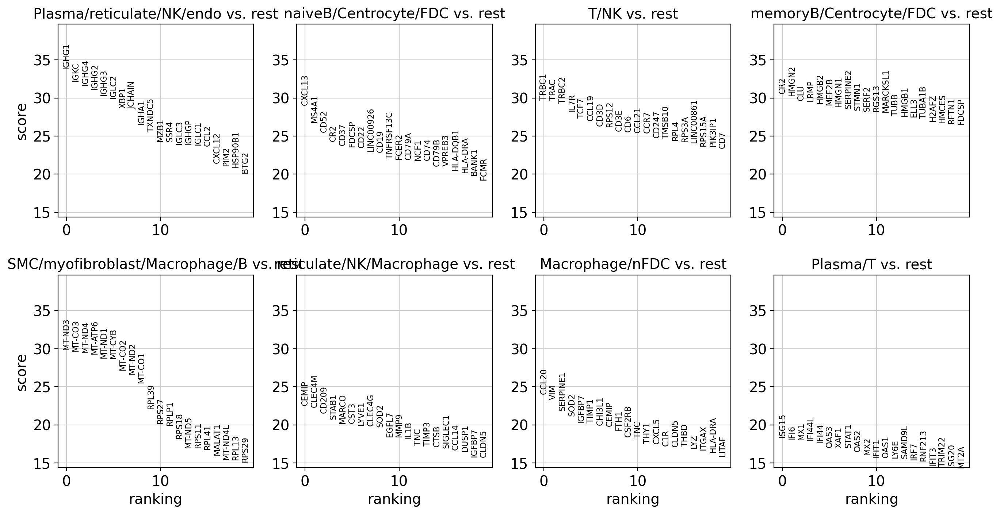

In [31]:
sc.pl.rank_genes_groups(adata, groupby="niche", key="niche_de", ncols=4)

In [32]:
import matplotlib.pyplot as plt
import gseapy as gp
from gseapy import barplot

/opt/conda/lib/python3.10/site-packages/gseapy/plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(


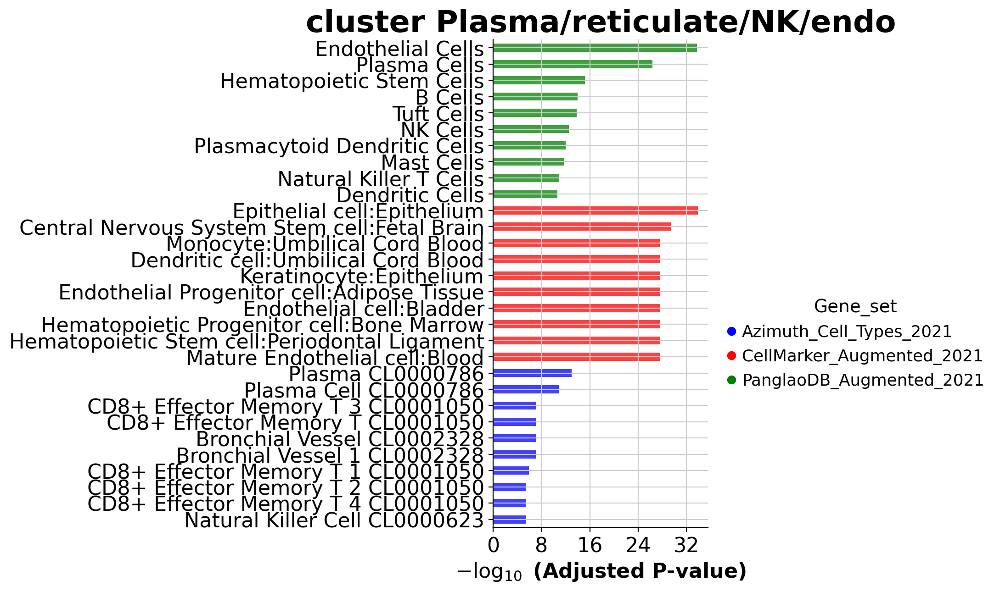

/opt/conda/lib/python3.10/site-packages/gseapy/plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(


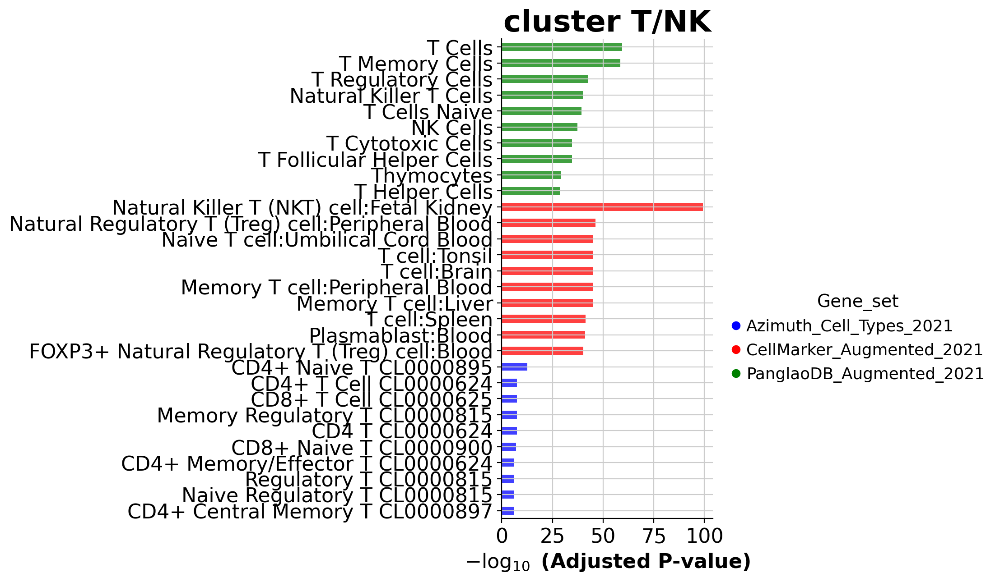

/opt/conda/lib/python3.10/site-packages/gseapy/plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(


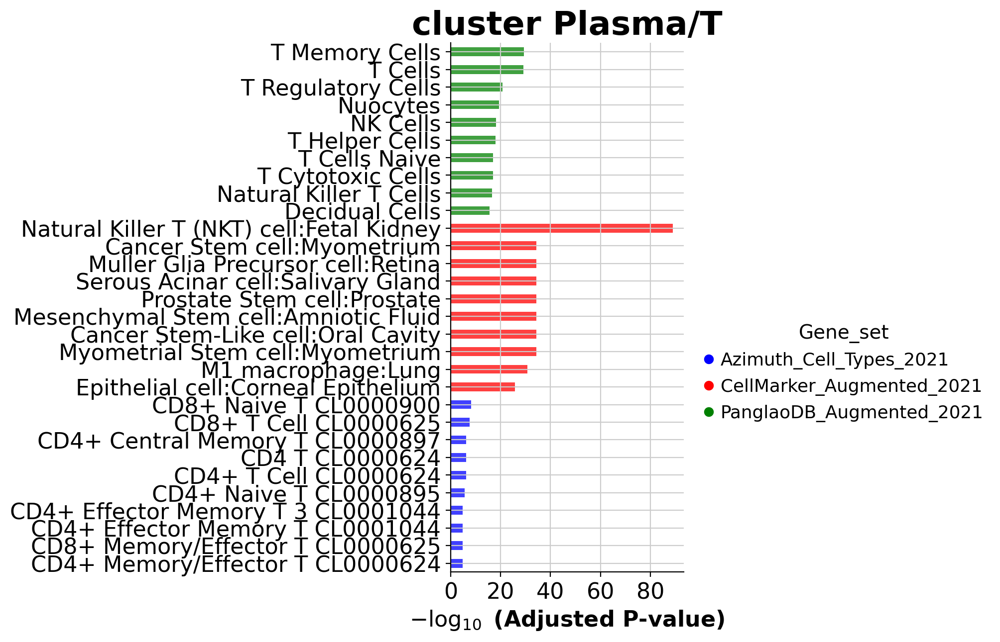

/opt/conda/lib/python3.10/site-packages/gseapy/plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(


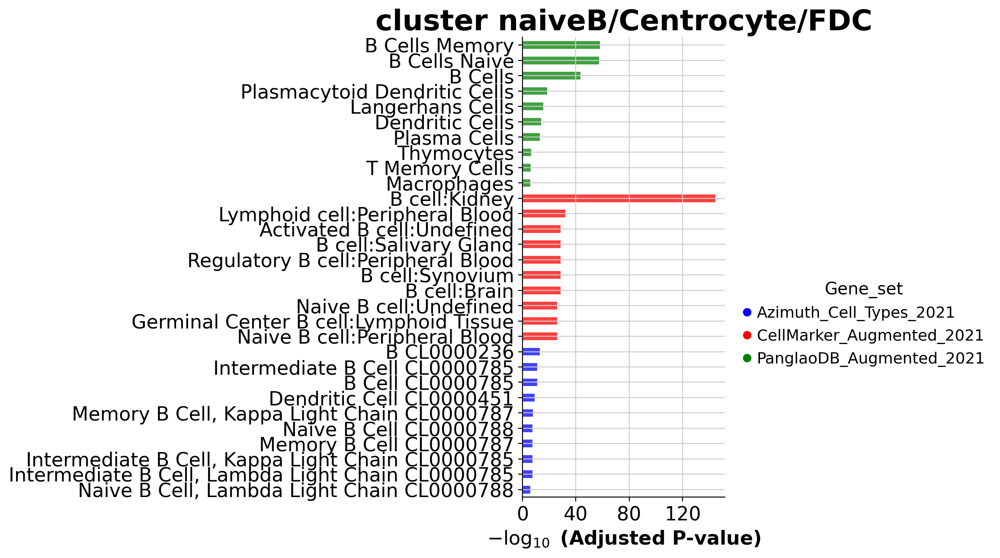

/opt/conda/lib/python3.10/site-packages/gseapy/plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(


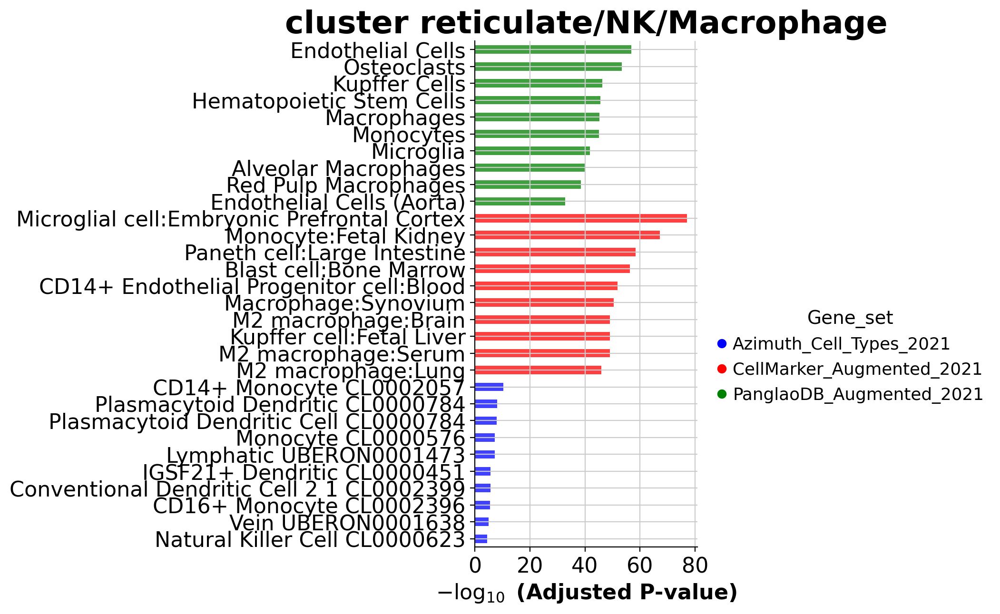

/opt/conda/lib/python3.10/site-packages/gseapy/plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(


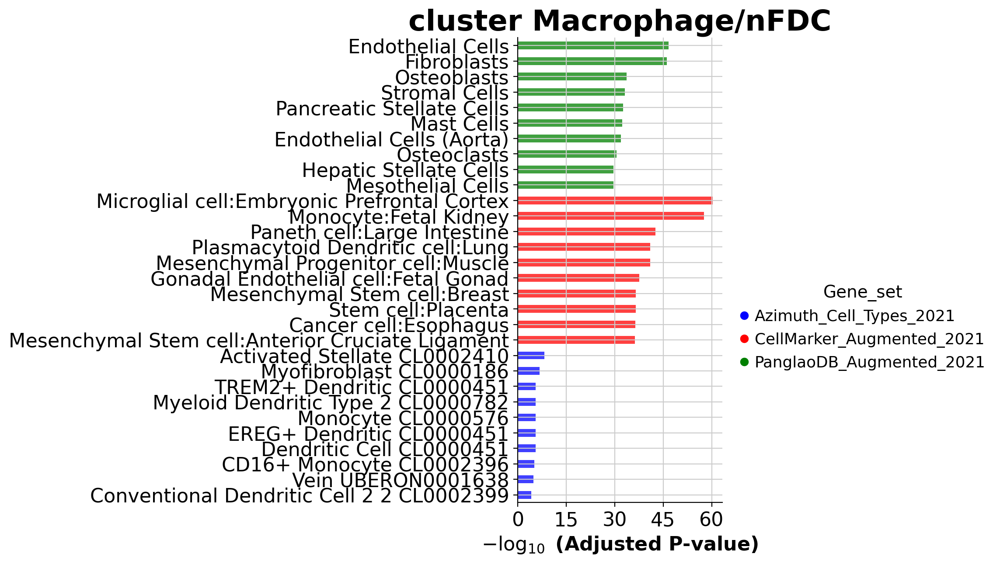

/opt/conda/lib/python3.10/site-packages/gseapy/plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(


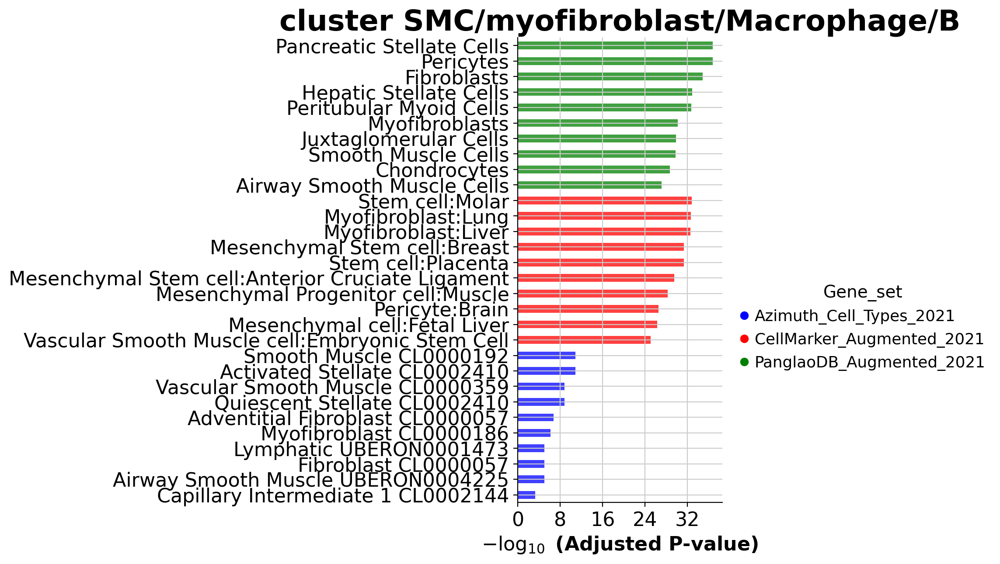

/opt/conda/lib/python3.10/site-packages/gseapy/plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(


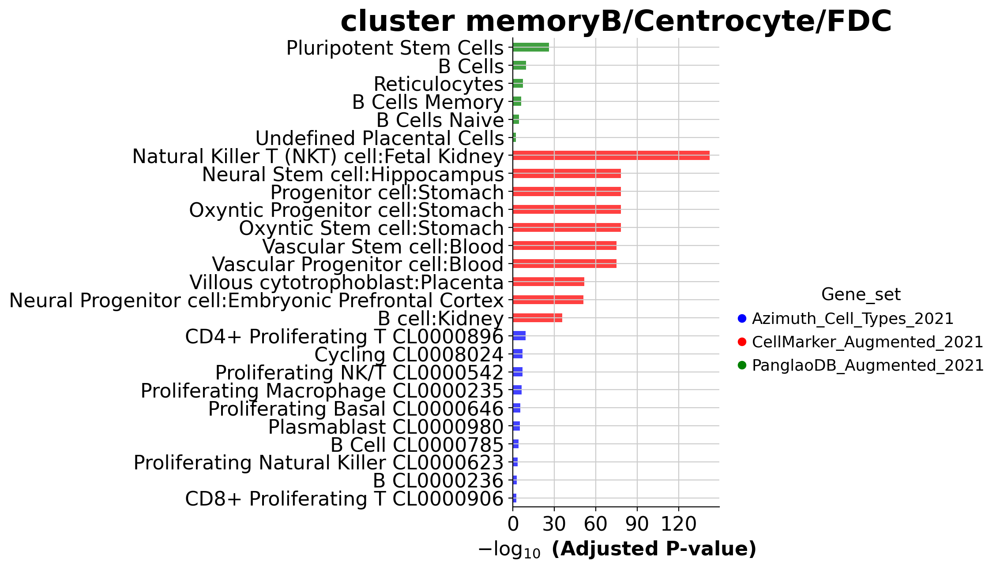

In [33]:
for group in adata.obs["niche"].unique():
    df = sc.get.rank_genes_groups_df(adata, group=group, pval_cutoff=0.05, log2fc_min=0.25, key="niche_de")
    genelist = df.names.tolist()
    enr = gp.enrichr(gene_list=genelist, # or "./tests/data/gene_list.txt",
                 gene_sets=["Azimuth_Cell_Types_2021", "CellMarker_Augmented_2021", "PanglaoDB_Augmented_2021"],
                 organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk
                )
    ax = barplot(enr.results,
                  column="Adjusted P-value",
                  group='Gene_set', # set group, so you could do a multi-sample/library comparsion
                  top_term=10,
                  figsize=(3,7),
                  color=["blue", "red", "green"],
                  title=f"cluster {group}"
                 )
    plt.show()

How do you interpret these results?

## Saving

In [34]:
# Save clustered anndata object
# replace the adata.X with log normalized counts and store the scaled counts in a layer.

adata.layers["scaled_counts"] = adata.X.copy() 
adata.X = adata.layers["log_counts"]

Great, we performed:
* Clustering
* Cluster annotation
* Comparison with image-based annotations
* Comparison with cell type marker databases

Let's now save the data ... 

In [35]:
adata.write("lymph_node_clustered.h5ad")

... and continue with [Session 4 - Neighborhood Enrichment](./Session_4_Neighborhood_Enrichment.ipynb).